# ASAP Human Postmortem-Derived Brain Sequencing Collection (PMDBS): Mapping to the SEA-AD Taxonomy 

In the previous notebooks, we provided an overview of the [ASAP-PMDBS dataset](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_data_and_metadata.html) and demonstrated using MapMyCells to provide cell type insights to the dataset by mapping to the [10X Whole Human Brain Taxonomy](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_siletti_taxonomy.html). In this notebook, we will additionally map the PMDBS cells to the 10X MTG SEA-AD taxonomy using hierarchical correlation mapping method and walkthrough additional cell types insights that can be glean.
 
The Seattle Alzheimer’s Disease Brain Cell Atlas ([SEA-AD](https://portal.brain-map.org/explore/seattle-alzheimers-disease)) is a consortium focused on gaining a deep molecular and cellular understanding of the early pathogenesis of Alzheimer’s Disease. The SEA-AD taxonomy is a high-resolution transcriptomic cell type atlas from middle temporal gyrus (MTG) from the SEA-AD aged human cohort that spans the spectrum of Alzheimer’s disease. The atlas was created from a single nucleus RNA-sequencing (snRNAseq) and multiomics dataset of roughly 2.0 million cells profiled (~1.4 million cells after QC) from 84 aged donors. The atlas is hierarchically organized into nested levels of classification: 3 classes, 24 subclasses, and 139 supertypes.

You need to be connected to the internet to run this notebook and should have run through the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html).

In [1]:
import anndata
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache

We will interact with the data using the AbcProjectCache. This cache object tracks which data has been downloaded and serves the path to the requested  data on disk. For metadata, the cache can also directly serve a up a Pandas DataFrame. See the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been.

Change the download_base variable to where you have downloaded the data in your system.

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(download_base)

abc_cache.current_manifest

'releases/20250531/manifest.json'

## Data Overview

### ASAP Data

We simplify the ASAP PMDB metadata into a single cell_metadata, csv file and there companion tables describing the donor (including sex, age, race, disease state etc.), sample (including data processing metadata, team information, and dissection or region of interest the sample is from), and value_sets which provides a mapping from unique term name (cell type, region of interest etc.) to a plotting color and order.

In [3]:
cell_metadata = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='cell_metadata'
).set_index('cell_label')
donor = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='donor'
).set_index('donor_label')
sample = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='sample'
).set_index('sample_label')
value_sets = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='value_sets'
).set_index('label')

As with our previous tutorials, we'll first use a Pandas join to merge the sample data into the cell metadata and then merge the donor information. We'll use the value_sets as a lookup.

In [4]:
cell_metadata = cell_metadata.join(sample, on='sample_label')
cell_metadata = cell_metadata.join(donor, on='donor_label')
cell_metadata.head()

,cell_barcode,sample_label,x,y,cluster_label,cluster_label_order,cluster_label_color,dataset_label,feature_matrix_label,abc_sample_id,...,cerad_score_color,cognitive_status,cognitive_status_order,cognitive_status_color,lewy_body_disease_pathology,lewy_body_disease_pathology_order,lewy_body_disease_pathology_color,thal_phase,thal_phase_order,thal_phase_color
cell_label,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAAACCAT-1_ASAP_PMBDS_000060_s002_Rep1,AAACCCAAGAAACCAT-1,ASAP_PMBDS_000060_s002,0.016373,1.403025,cluster_000,1,#171c97,ASAP-PMDBS-10X,ASAP-PMDBS-10X,cc633260-614c-4e5c-aa18-d3e3a0ef81bb,...,#4daf4a,Unknown,4,#e8e8e8,Absent,1,#ffffd9,Thal 3,4,#df65b0
AAACCCAAGAAACTCA-1_ASAP_PMBDS_000088_s001_Rep1,AAACCCAAGAAACTCA-1,ASAP_PMBDS_000088_s001,10.029368,1.342043,cluster_013,14,#aa5ed0,ASAP-PMDBS-10X,ASAP-PMDBS-10X,4b4f4355-6463-4bf2-9544-3f6d493de741,...,#4daf4a,Unknown,4,#e8e8e8,Absent,1,#ffffd9,Thal 2,3,#c994c7
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000177_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000177_s001,-9.057206,-1.032092,cluster_006,7,#f591a5,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0ea675f3-4b39-4c16-9518-66ddd9c409a1,...,#e41a1c,Mild Cognitive Impairment,2,#377eb8,Brainstem/Limbic,5,#41b6c4,Thal 3,4,#df65b0
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000185_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000185_s001,-0.685645,-4.943793,cluster_001,2,#e4a9ba,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0eb0506b-e76b-4f9a-a3b6-bc6bbccfdd32,...,#e41a1c,Mild Cognitive Impairment,2,#377eb8,Brainstem predominant,4,#7fcdbb,Thal 3,4,#df65b0
AAACCCAAGAAATCCA-1_ASAP_PMBDS_000122_s002_1,AAACCCAAGAAATCCA-1,ASAP_PMBDS_000122_s002,-3.507261,13.855699,cluster_002,3,#a02226,ASAP-PMDBS-10X,ASAP-PMDBS-10X,1f67fc2a-7e81-4448-8437-e2c6ef8b4b1b,...,#e8e8e8,Unknown,4,#e8e8e8,Unknown,10,#e8e8e8,Unknown,8,#e8e8e8


### Loading MapMyCells SEA-AD Taxonomy Results 

We load the MapMyCells hierarchical correlation mapping to 10X SEA-AD taxonomy results. These are calculated for each cell and can be merged into our cell_metadata table on cell_label index. For more information on MapMyCells see [here](https://portal.brain-map.org/atlases-and-data/bkp/mapmycells). 

Note that the SEA-AD taxonomy was created using data from the middle temporal gyrus (MTG) of the cortex. This means the model used in MapMyCells for this taxonomy has no knowledge of cell types specific to non-cortical regions. For most of this section we plot all cells and plot data from cortical regions only later in this notebook.

In [5]:
seaad_mmc_results = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-taxonomy',
    file_name='mmc_results_seaad',
    comment='#'
).set_index('cell_label')
seaad_mmc_results.head()

mmc_results_seaad.csv: 100%|██████████| 1.25G/1.25G [02:06<00:00, 9.93MMB/s]   


,class_label,class_name,class_bootstrapping_probability,class_correlation_coefficient,class_aggregate_probability,subclass_label,subclass_name,subclass_bootstrapping_probability,subclass_correlation_coefficient,subclass_aggregate_probability,supertype_label,supertype_name,cluster_alias,supertype_bootstrapping_probability,supertype_correlation_coefficient,supertype_aggregate_probability
cell_label,,,,,,,,,,,,,,,,
AGCGATTCAGAATGTA-1_ASAP_PMBDS_000105_s001_1,CS20230505_CLAS_0003,Non-neuronal and Non-neural,1.0,0.8412,1.0,CS20230505_SUBC_0020,OPC,1.00,0.9091,1.00,CS20230505_SUPT_0117,OPC_2,OPC_2,0.89,0.5850,0.890
GGTGAAGCAGACAATA-1_ASAP_PMBDS_000105_s001_1,CS20230505_CLAS_0003,Non-neuronal and Non-neural,1.0,0.8666,1.0,CS20230505_SUBC_0021,Oligodendrocyte,1.00,0.9192,1.00,CS20230505_SUPT_0120,Oligo_1,Oligo_1,1.00,0.6472,1.000
ATTTACCGTTCTAACG-1_ASAP_PMBDS_000105_s001_1,CS20230505_CLAS_0003,Non-neuronal and Non-neural,1.0,0.9235,1.0,CS20230505_SUBC_0021,Oligodendrocyte,1.00,0.9607,1.00,CS20230505_SUPT_0120,Oligo_1,Oligo_1,1.00,0.6456,1.000
CTCAAGACACGCTTAA-1_ASAP_PMBDS_000105_s001_1,CS20230505_CLAS_0003,Non-neuronal and Non-neural,1.0,0.7778,1.0,CS20230505_SUBC_0019,Astrocyte,1.00,0.6605,1.00,CS20230505_SUPT_0114,Astro_3,Astro_3,0.96,0.4966,0.960
TCGCTTGGTGCGACAA-1_ASAP_PMBDS_000105_s001_1,CS20230505_CLAS_0003,Non-neuronal and Non-neural,1.0,0.7626,1.0,CS20230505_SUBC_0020,OPC,0.89,0.7246,0.89,CS20230505_SUPT_0118,OPC_2_1-SEAAD,OPC_2_1-SEAAD,0.70,0.3631,0.623


#### SEA-AD Taxonomy Metadata.

Below we load the various metadata we need to map and plot our taxonomy in the UMAP. We then merge these data into the main cell metadata table. For full details on these tables, see the previous [ASAP-PMDBS](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_data_and_metadata.html) tutorial on the [Siletti taxonomy](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_siletti_taxonomy.html)

In [6]:
cluster_annotation_term = abc_cache.get_metadata_dataframe(
    directory='SEAAD-taxonomy',
    file_name='cluster_annotation_term',
).set_index('name')
membership = abc_cache.get_metadata_dataframe(
    directory='SEAAD-taxonomy',
    file_name='cluster_to_cluster_annotation_membership',
)
cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='SEAAD-taxonomy',
    file_name='cluster_annotation_term_set',
)

membership_groupby = membership.groupby(['cluster_alias', 'cluster_annotation_term_set_name'])
cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_details = cluster_details[cluster_annotation_term_set['name']] # order columns
cluster_details.fillna('Other', inplace=True)
cluster_details.sort_values(['class', 'subclass', 'supertype'], inplace=True)

cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]
cluster_colors.sort_values(['class', 'subclass', 'supertype'], inplace=True)

cell_metadata = cell_metadata.join(seaad_mmc_results)
cell_metadata = cell_metadata.join(cluster_details[['abundancechangecps']], on='cluster_alias')
cell_metadata = cell_metadata.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_metadata.head()

cluster_annotation_term.csv: 100%|██████████| 19.4k/19.4k [00:00<00:00, 293kMB/s]
cluster_to_cluster_annotation_membership.csv: 100%|██████████| 43.4k/43.4k [00:00<00:00, 384kMB/s]
cluster_annotation_term_set.csv: 100%|██████████| 204/204 [00:00<00:00, 2.79kMB/s]


,cell_barcode,sample_label,x,y,cluster_label,cluster_label_order,cluster_label_color,dataset_label,feature_matrix_label,abc_sample_id,...,supertype_name,cluster_alias,supertype_bootstrapping_probability,supertype_correlation_coefficient,supertype_aggregate_probability,abundancechangecps,class,subclass,supertype,abundancechangecps_color
cell_label,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAAACCAT-1_ASAP_PMBDS_000060_s002_Rep1,AAACCCAAGAAACCAT-1,ASAP_PMBDS_000060_s002,0.016373,1.403025,cluster_000,1,#171c97,ASAP-PMDBS-10X,ASAP-PMDBS-10X,cc633260-614c-4e5c-aa18-d3e3a0ef81bb,...,L6 IT_2,L6 IT_2,0.78,0.0007,0.277,unchanged,#00ADF8,#A19922,#716C18,#F7F7F7
AAACCCAAGAAACTCA-1_ASAP_PMBDS_000088_s001_Rep1,AAACCCAAGAAACTCA-1,ASAP_PMBDS_000088_s001,10.029368,1.342043,cluster_013,14,#aa5ed0,ASAP-PMDBS-10X,ASAP-PMDBS-10X,4b4f4355-6463-4bf2-9544-3f6d493de741,...,L6 CT_3,L6 CT_3,0.74,0.3515,0.740,unchanged,#00ADF8,#2D8CB8,#3D7A91,#F7F7F7
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000177_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000177_s001,-9.057206,-1.032092,cluster_006,7,#f591a5,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0ea675f3-4b39-4c16-9518-66ddd9c409a1,...,L4 IT_2,L4 IT_2,0.95,0.4353,0.893,unchanged,#00ADF8,#00E5E5,#72C3C7,#F7F7F7
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000185_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000185_s001,-0.685645,-4.943793,cluster_001,2,#e4a9ba,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0eb0506b-e76b-4f9a-a3b6-bc6bbccfdd32,...,L2/3 IT_1,L2/3 IT_1,0.98,0.5391,0.980,decrease,#00ADF8,#B1EC30,#EEF987,#2166AC
AAACCCAAGAAATCCA-1_ASAP_PMBDS_000122_s002_1,AAACCCAAGAAATCCA-1,ASAP_PMBDS_000122_s002,-3.507261,13.855699,cluster_002,3,#a02226,ASAP-PMDBS-10X,ASAP-PMDBS-10X,1f67fc2a-7e81-4448-8437-e2c6ef8b4b1b,...,Oligo_2_1-SEAAD,Oligo_2_1-SEAAD,0.96,0.3915,0.960,unchanged,#808080,#53776C,#5A9B82,#F7F7F7


## UMAP Plotting

We define convenience function to plot the Uniform Manifold Approximation and Projection (UMAP) of the ASAP PMDB data.

In [7]:
def plot_umap(
    xx,
    yy,
    cc=None,
    val=None,
    fig_width=8,
    fig_height=8,
    cmap=None,
    labels=None,
    term_order_lookup=None,
    colorbar=False,
    sizes=None
):
    """
    """
    if sizes is None:
        sizes = 1
    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_labels = labels.unique()
        unique_colors = cc.unique()

        if term_order_lookup is not None:
            term_order = np.argsort(term_order_lookup.loc[unique_labels, 'term_order'])
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=2)
        # ax.add_artist(legend)

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

### Transferred Whole Human Brain Taxonomy Types 

The next set of plots colorized the PMDBS cells by SEA-AD taxonomy at the class, subclass and supertype levels. At the class level, the SEA-AD divides cells into broad GABAergic, Glutamatergic, non-neuronal and non-neural classes. Compared to Siletti superclusters, colorization by SEA-AD subclasses provides next level annotation to cortical Glut IT (intratelencephalic), CT (corticothalamic) and NP (near-projecting) types with laminar specificity. As well as division of CGE and MGE GABA types into major subclasses: Sst, Pvalb, Sst Chodl, Chandelier, Lamp5 Lhx6, Lamp5, Vip, Sncg and Pax6.  Much like the results with WHB taxonomy mapping, we see that the center of the UMAP contains an ambiguous region of mixed assignments.

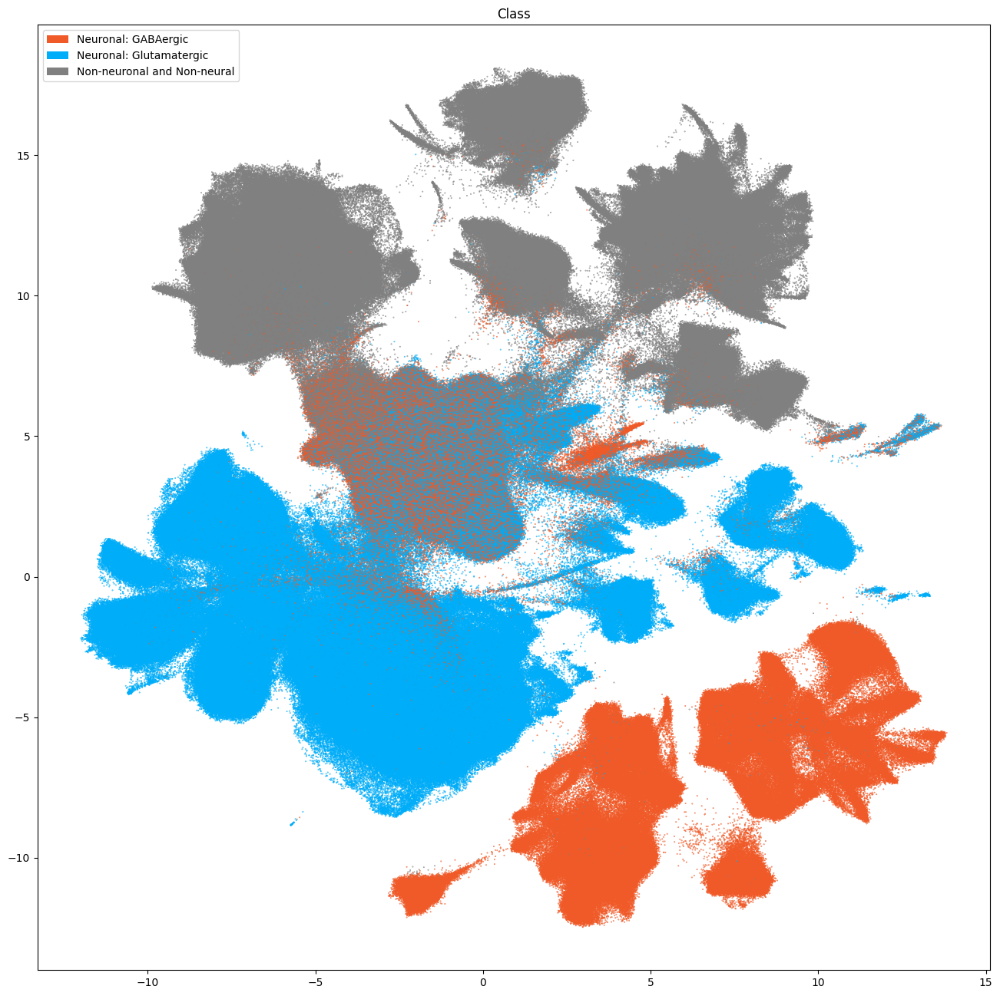

In [8]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['class'],
    labels=cell_metadata['class_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Class")
plt.show()

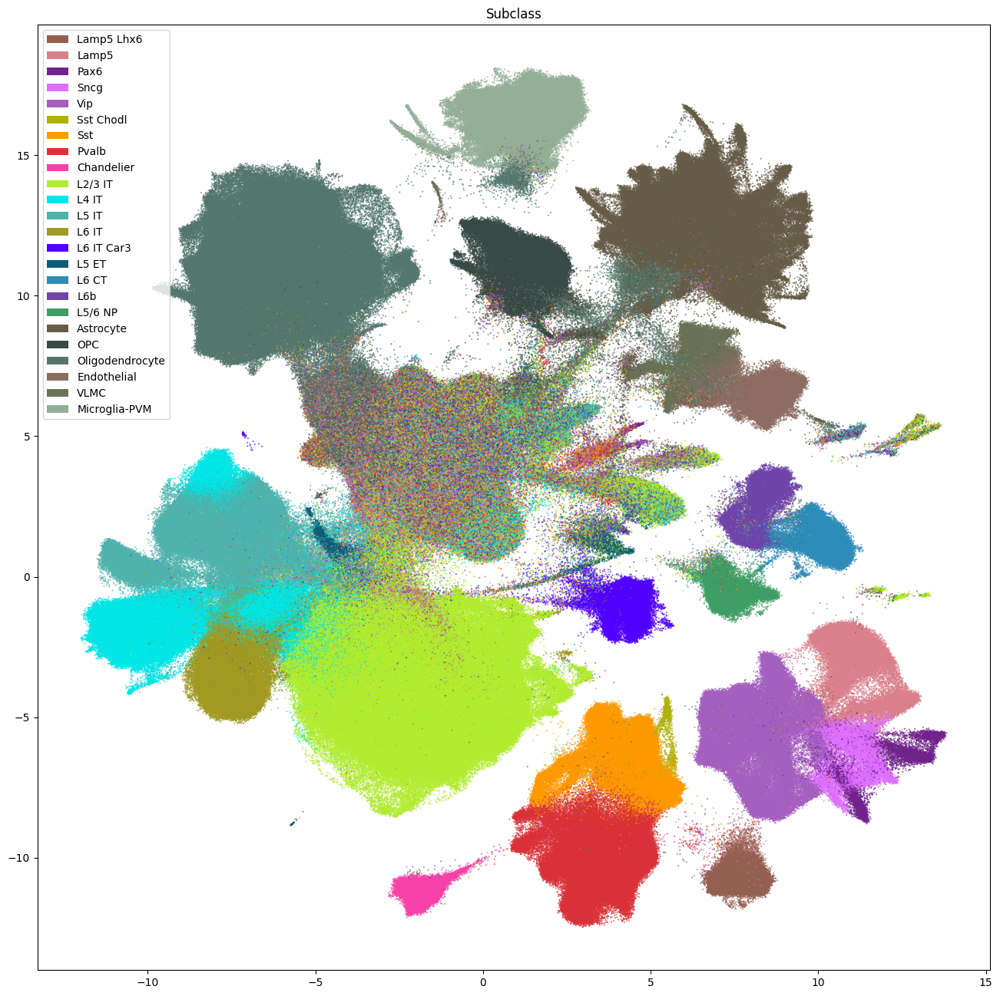

In [9]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['subclass'],
    labels=cell_metadata['subclass_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Subclass")
plt.show()

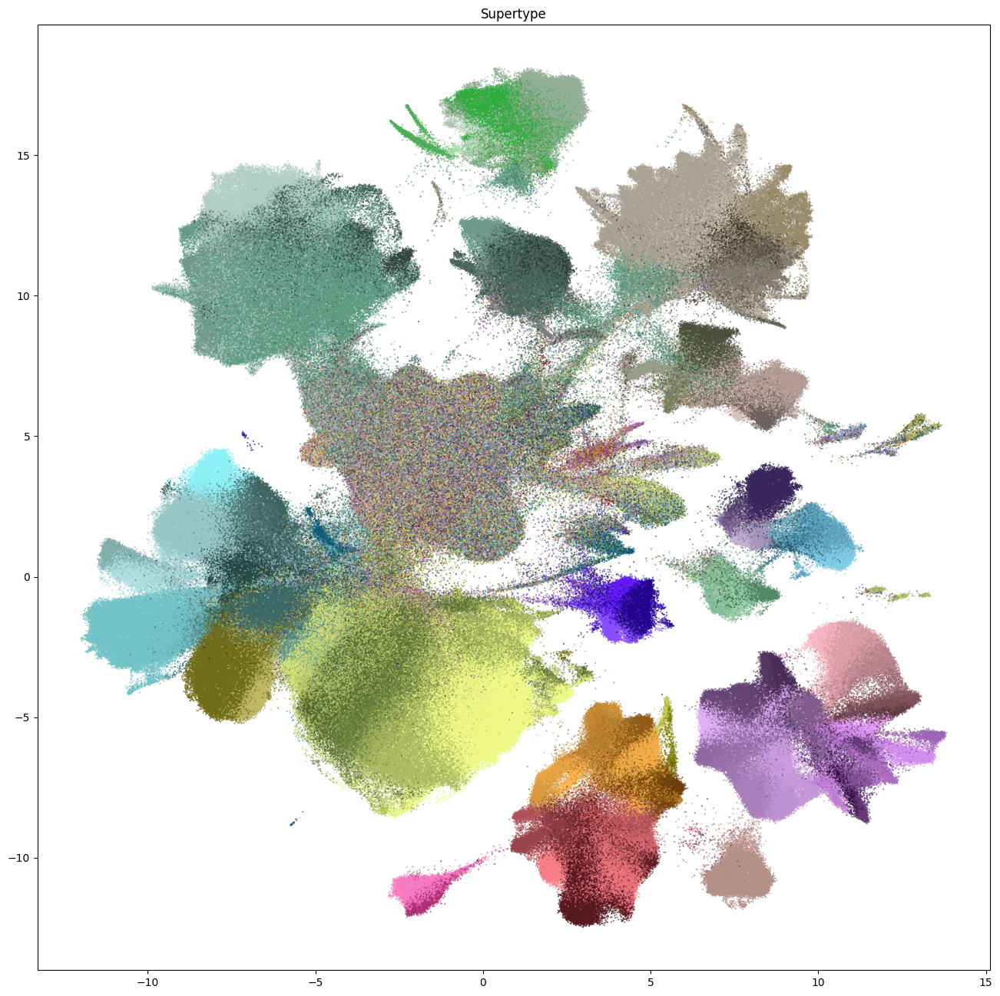

In [10]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['supertype'],
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Supertype")
plt.show()

### Assignment Correlation and Probabilities 

The next three plots colorized PDMBS cells by the boostrapping probability at each level. Here we see that cells in the center part of the UMAP have the lowest probability mapping at every level and corresponding to where we also see highly mixed supercluster assignments. Since the SEA-AD taxonomy is based on cortical data, we also see low probability on additional cluster islands (compared to WHB mapping results) derived from regions outside of the isocortex such as the hippocampus, amygdala and putamen. We refer to these as "non-cortical" in the remainder of the notebook.

The final two plots colorized the cells by the aggregated probability and correlation coefficient at the subclass level.

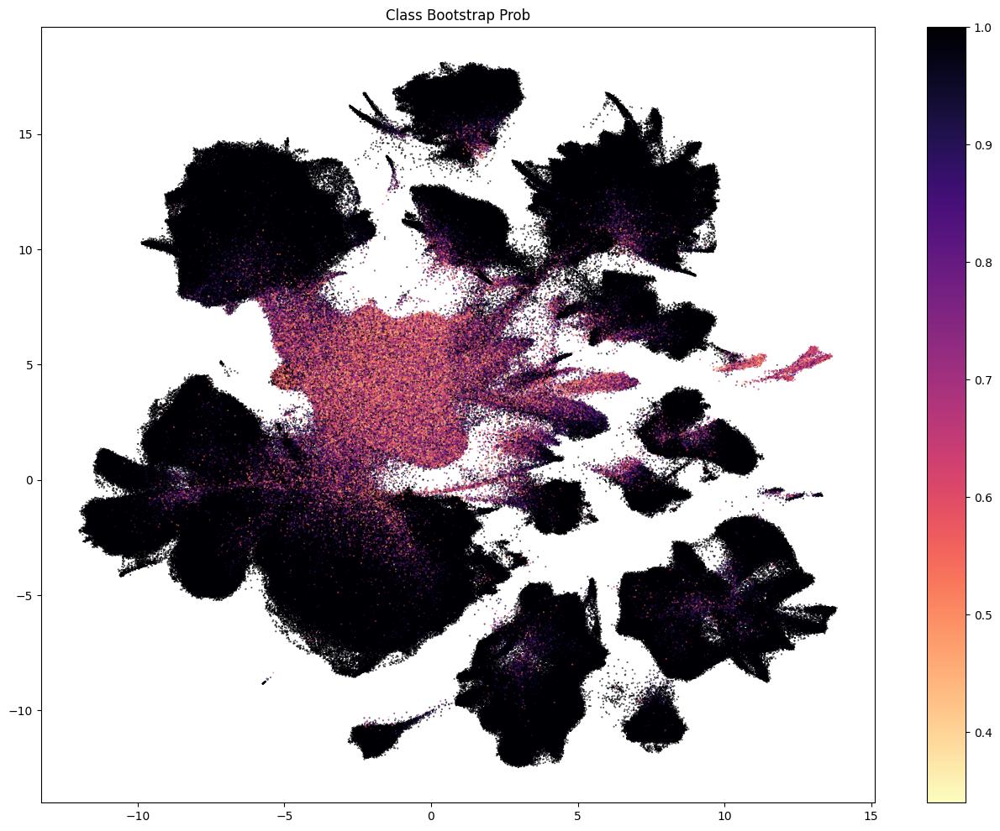

In [11]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    val=cell_metadata['class_bootstrapping_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Class Bootstrap Prob")
plt.show()

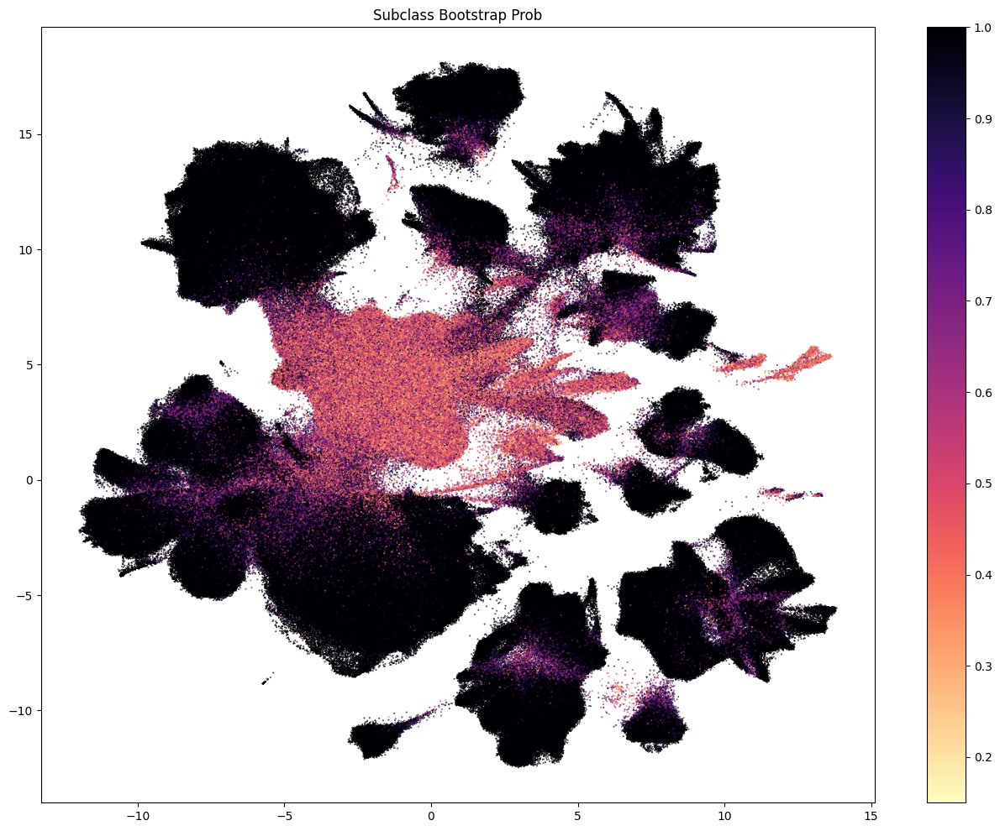

In [12]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    val=cell_metadata['subclass_bootstrapping_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Subclass Bootstrap Prob")
plt.show()

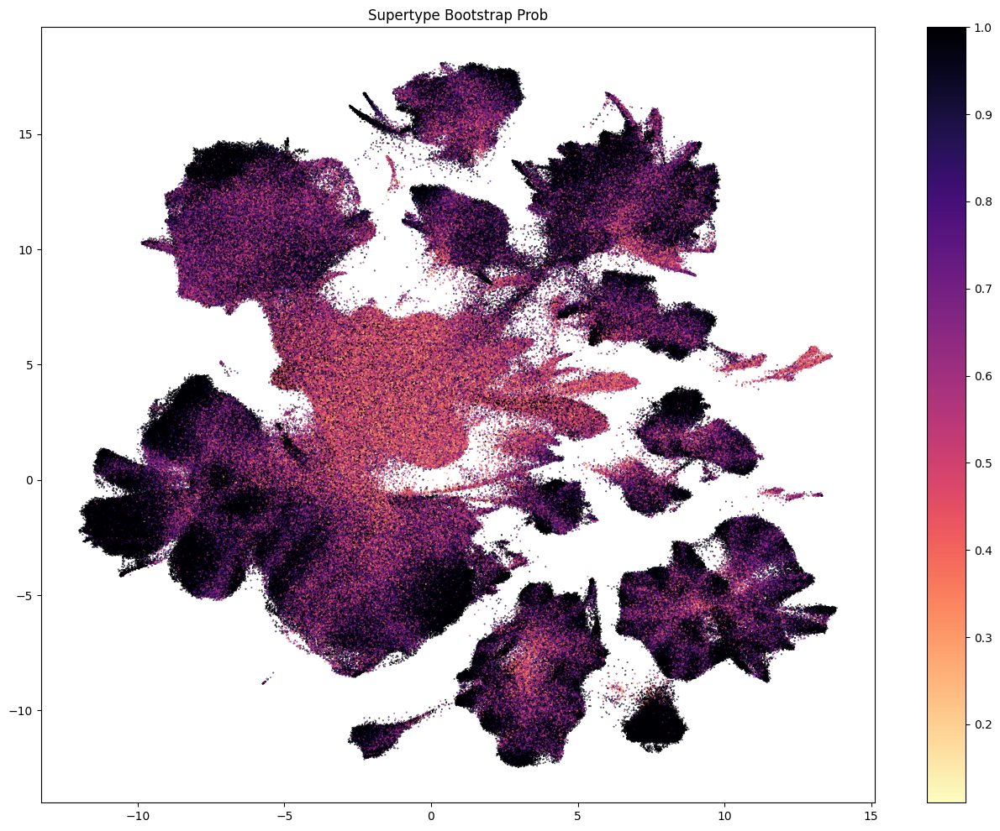

In [13]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    val=cell_metadata['supertype_bootstrapping_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Supertype Bootstrap Prob")
plt.show()

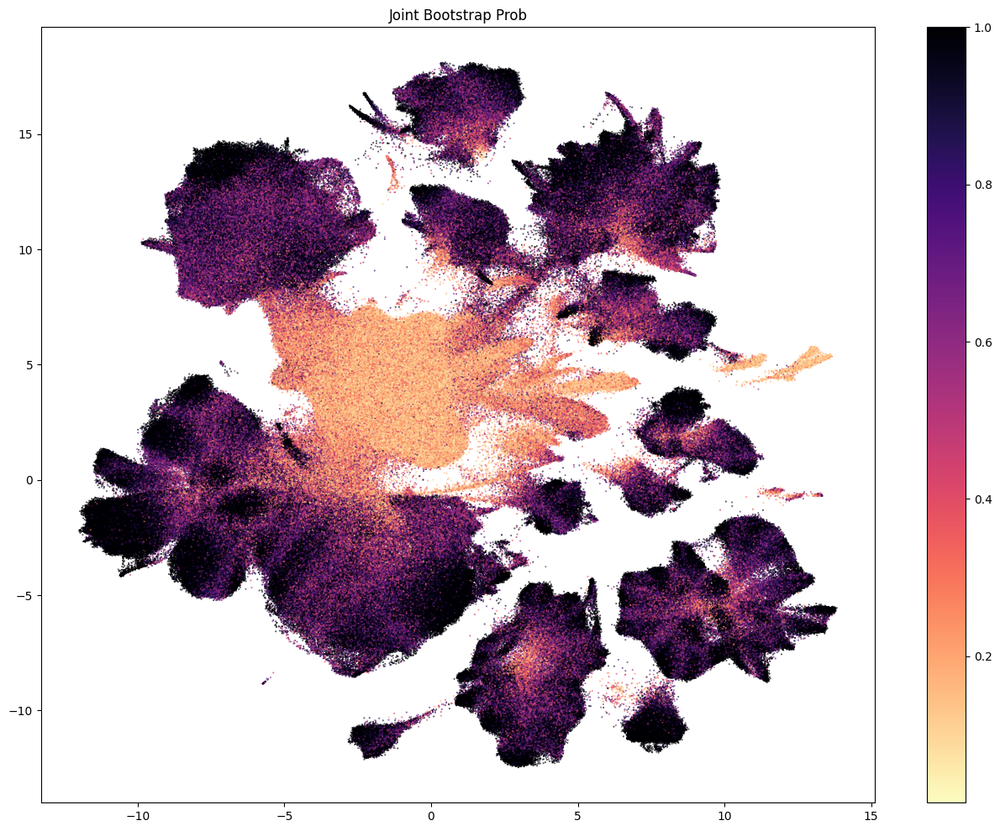

In [14]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    val=cell_metadata['supertype_aggregate_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Joint Bootstrap Prob")
plt.show()

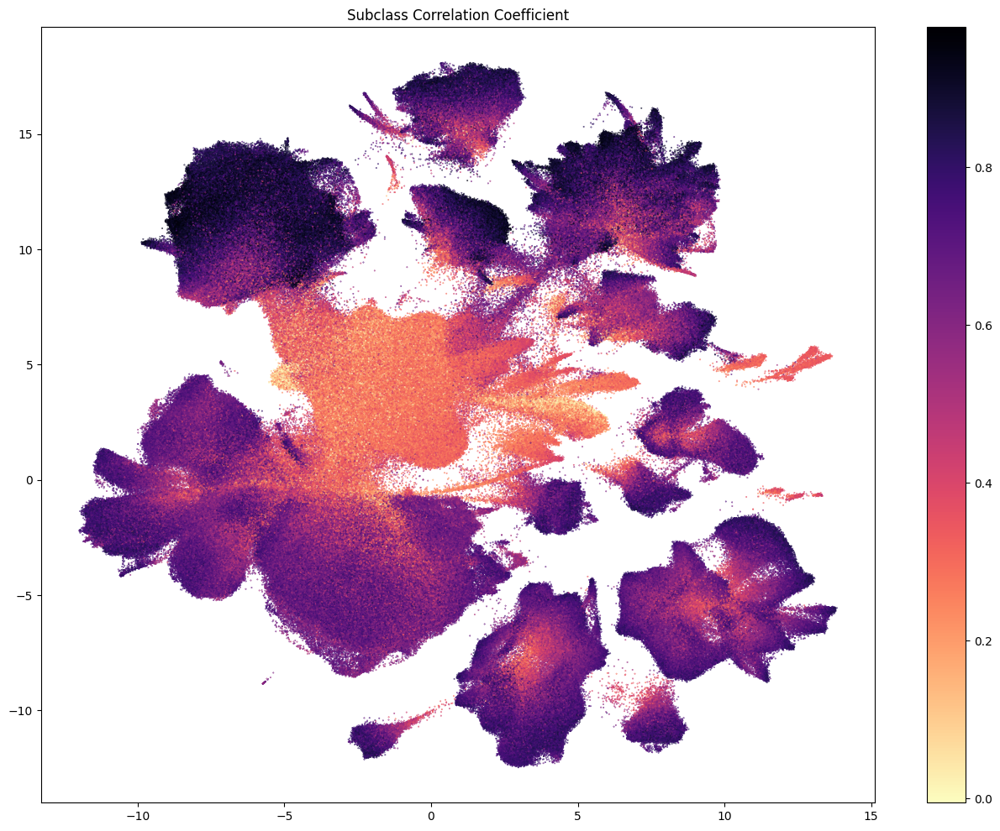

In [15]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    val=cell_metadata['subclass_correlation_coefficient'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Subclass Correlation Coefficient")
plt.show()

## Removing cells with low quality mapping and from non-cortical samples

Since we know that the SEA-AD taxonomy was created using only cortical regions, we will remove this before making our cut on subclass, mapping probability and correlation. 

In [16]:
cortical_mask = cell_metadata['region_of_interest_label'].isin([
    'middle frontal gyrus', 'prefrontal cortex', 'inferior parietal lobule',
    'middle temporal gyrus', 'anterior cingulate gyrus'
])
# We make a simple label to tell use which cells are cortical based on the mask above.
cell_metadata['cortex'] = np.where(cortical_mask, 'cortical', 'non-cortical')
cell_metadata['cortex_color'] = np.where(cortical_mask, '#FF0000', '#808080')

cell_seaad_cortex_only = cell_metadata[cortical_mask]
cell_seaad_noncortex = cell_metadata[~cortical_mask]

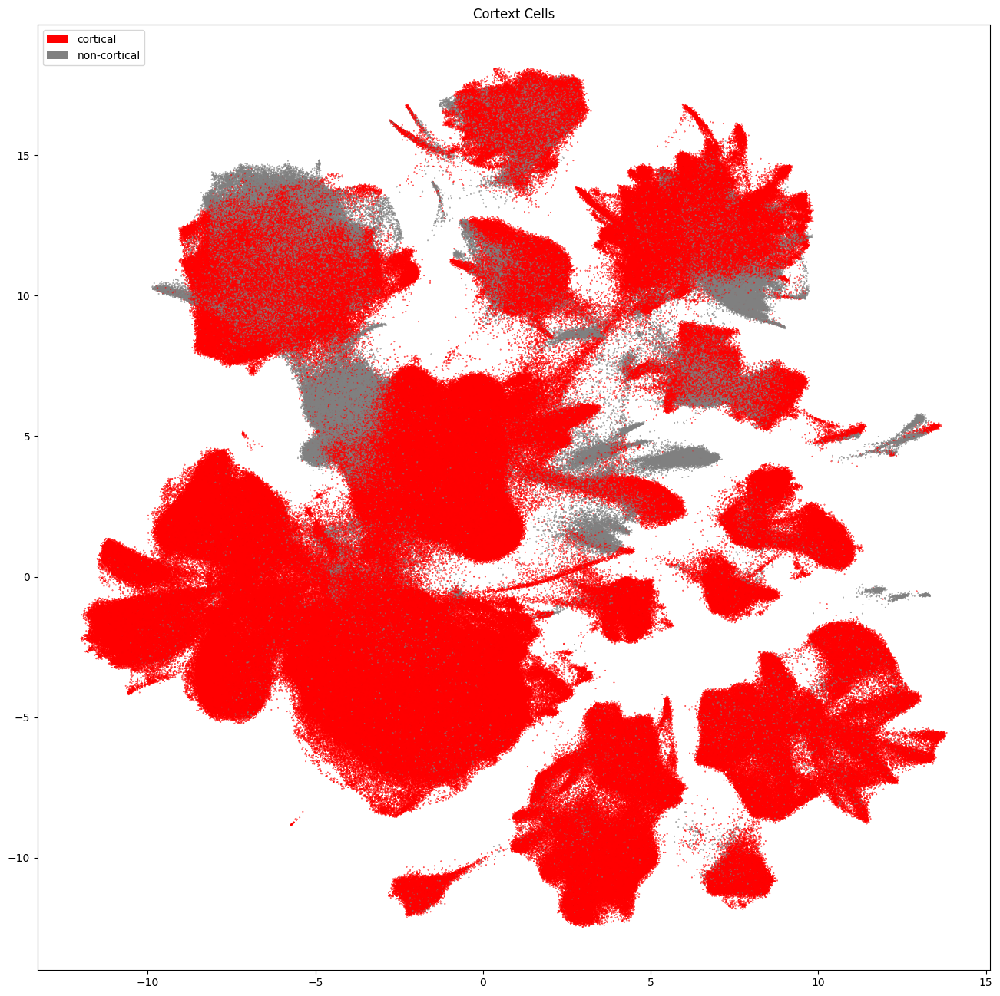

In [17]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['cortex_color'],
    labels=cell_metadata['cortex'],
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Cortext Cells")
plt.show()

Again, like the [Siletti tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_siletti_taxonomy.html), we make a simple cut of probability and correlation coefficient of > 0.5. We combine this with our cortical mask to get the highest quality cells. These cuts combine to remove roughly half of the cells and most of the cells from the central region of the UMAP. These cuts are not definitive, and users should play with them to achieve a cell mapping quality to their liking. 

In [18]:
prob_05_cut = np.logical_and(
    cell_metadata['subclass_aggregate_probability'] > 0.5,
    cell_metadata['subclass_correlation_coefficient'] > 0.5
)
cell_seaad_prob_high = cell_metadata[prob_05_cut & cortical_mask]
cell_seaad_prob_low = cell_metadata[~(prob_05_cut & cortical_mask)]

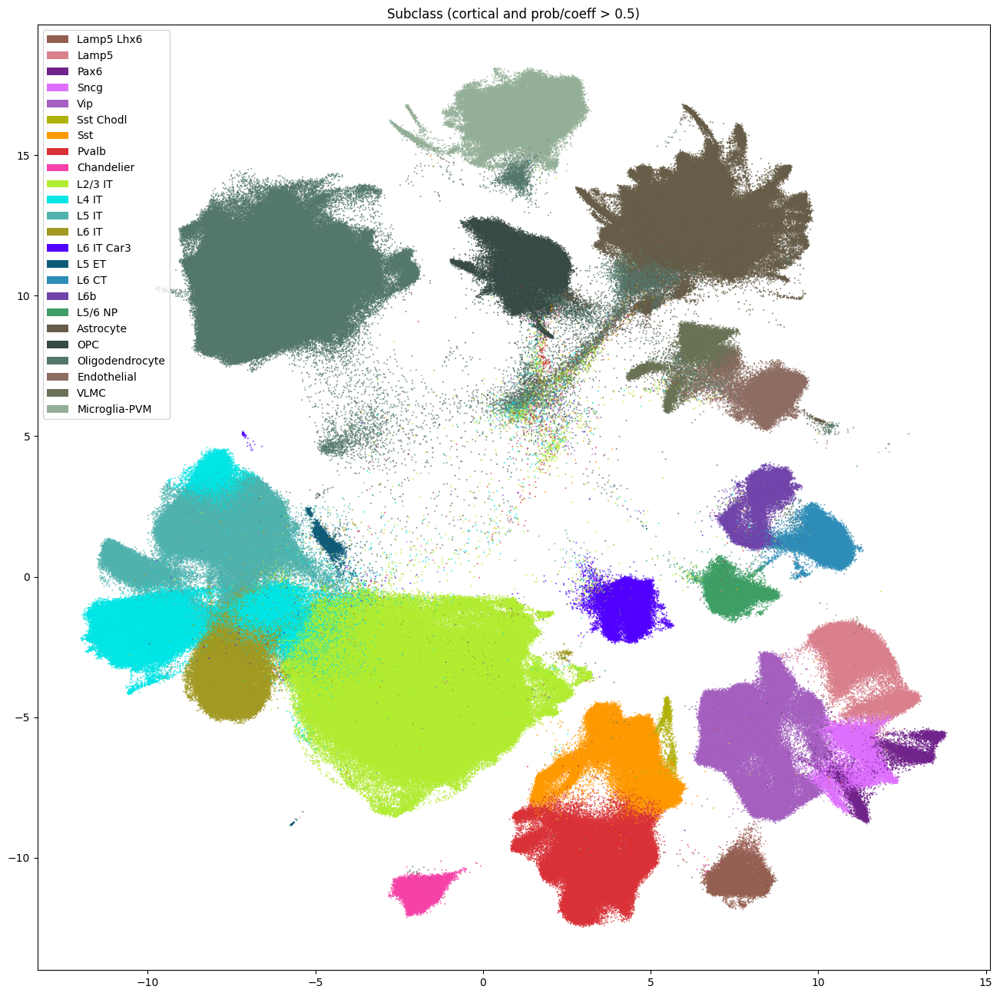

In [19]:
fig, ax = plot_umap(
    cell_seaad_prob_high['x'],
    cell_seaad_prob_high['y'],
    cc=cell_seaad_prob_high['subclass'],
    labels=cell_seaad_prob_high['subclass_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Subclass (cortical and prob/coeff > 0.5)")
plt.show()

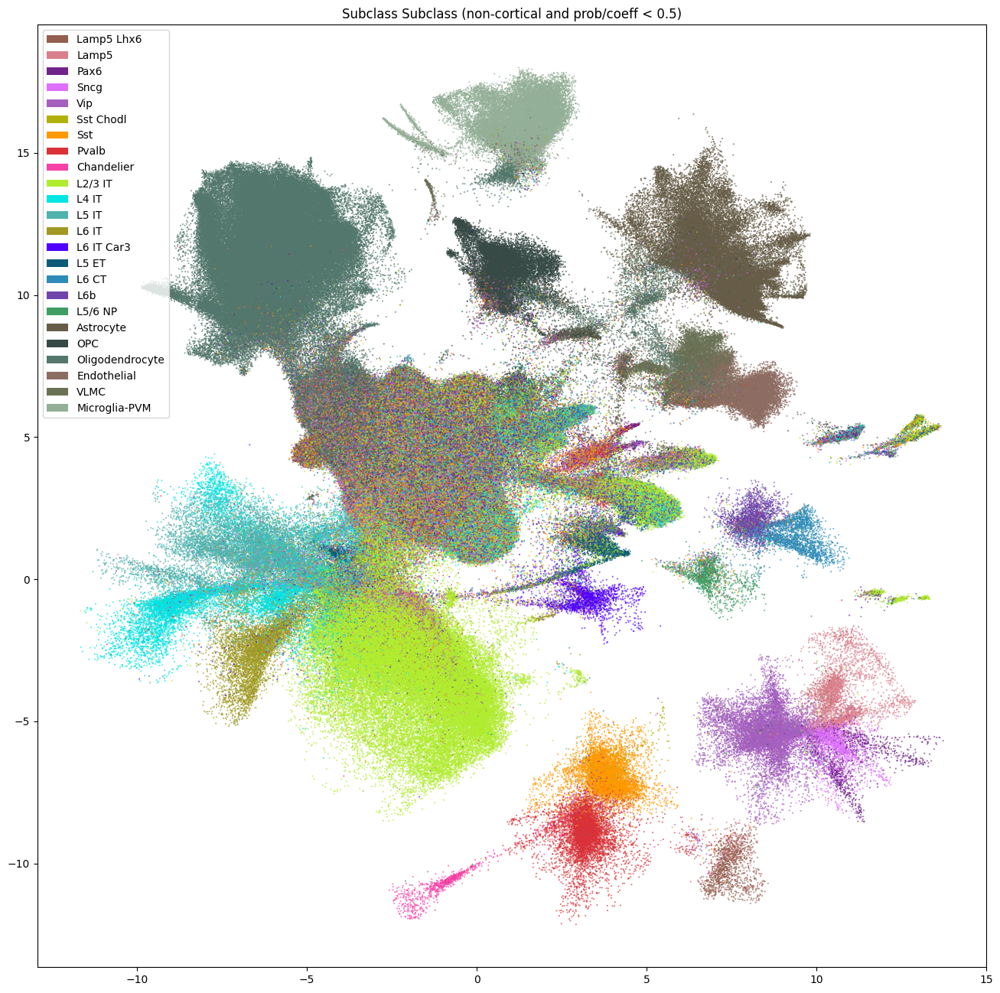

In [20]:
fig, ax = plot_umap(
    cell_seaad_prob_low['x'],
    cell_seaad_prob_low['y'],
    cc=cell_seaad_prob_low['subclass'],
    labels=cell_seaad_prob_low['subclass_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Subclass Subclass (non-cortical and prob/coeff < 0.5)")
plt.show()

## Mapping the SEA-AD subclasses on to the Leiden Clusters

Finally, we'll use the mapping of the cells into the SEA-AD taxonomy to infer mappings of the Leiden clusters that the ASAP PMDBS data provide. To do this, we'll compute the fraction of cells that are in each Leiden cluster that are mapped into a SEA-AD subclass. 

In [21]:
group = cell_seaad_prob_high.groupby(['cluster_label', 'subclass_name'])[['subclass']].count()
assignment_df = pd.DataFrame(
    index=cell_seaad_prob_high['subclass_name'].unique(),
    columns=cell_seaad_prob_high['cluster_label'].unique()
).fillna(0.0)

for clust_lab in cell_seaad_prob_high['cluster_label'].unique():
    subgroup = group.loc[clust_lab]
    assignment_df.loc[subgroup.index, clust_lab] = (subgroup / subgroup.sum()).to_numpy()

assignment_df = assignment_df.reindex(
    sorted(assignment_df.columns), axis=1
).loc[
    cluster_annotation_term[cluster_annotation_term['cluster_annotation_term_set_name'] == 'subclass'].sort_values('term_order').index
]

column_order = []
for row_idx, supertype in enumerate(assignment_df.index):
    saved_cols = []
    col_maxes = []
    for col in assignment_df.columns:
        max_arg = np.argmax(assignment_df[col])
        if max_arg == row_idx:
            saved_cols.append(col)
            col_maxes.append(assignment_df[col][max_arg])
    saved_cols = np.array(saved_cols)
    column_order.extend(saved_cols)

assignment_df = assignment_df[column_order]
assignment_df.head()

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_52598/2341538799.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(0.0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_52598/2341538799.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  col_maxes.append(assignment_df[col][max_arg])


,cluster_018,cluster_012,cluster_025,cluster_009,cluster_004,cluster_020,cluster_001,cluster_014,cluster_021,cluster_028,...,cluster_024,cluster_027,cluster_008,cluster_000,cluster_002,cluster_015,cluster_022,cluster_010,cluster_007,cluster_026
name,,,,,,,,,,,,,,,,,,,,,
Lamp5 Lhx6,0.983864,0.000589,0.142857,0.000151,0.000174,0.000208,0.000013,0.036299,0.000103,0.0,...,0.0,0.0,0.000017,0.002577,0.000000,0.0,0.0,0.000028,0.0,0.0
Lamp5,0.012955,0.573468,0.285714,0.000786,0.000348,0.000934,0.000035,0.018505,0.000207,0.0,...,0.0,0.0,0.000679,0.006559,0.000004,0.0,0.0,0.000197,0.0,0.0
Pax6,0.000000,0.165833,0.000000,0.002025,0.000035,0.000000,0.000019,0.007829,0.000103,0.0,...,0.0,0.0,0.000000,0.000703,0.000004,0.0,0.0,0.000028,0.0,0.0
Sncg,0.000000,0.248611,0.000000,0.004518,0.000148,0.000208,0.000016,0.005694,0.000103,0.0,...,0.0,0.0,0.000296,0.001874,0.000000,0.0,0.0,0.000056,0.0,0.0
Vip,0.000694,0.009752,0.000000,0.989771,0.000321,0.001038,0.000131,0.043416,0.000207,0.0,...,0.0,0.0,0.000609,0.006090,0.000004,0.0,0.0,0.000366,0.0,0.0


In [22]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", xtick_colors=None, **kwargs):
    """
    from: https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html

    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current Axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    xtick_colors
        Set of colors to label the x ticklabels by. Must be the same length as
        col_labels. Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(range(data.shape[1]), labels=col_labels,
                  rotation=-30, ha="right", rotation_mode="anchor")
    ax.set_yticks(range(data.shape[0]), labels=row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    if xtick_colors is not None:
        xticks = ax.get_xticklabels()

        for idx, tick in enumerate(xticks):
            tick.set_color(xtick_colors[idx])

        ax.set_xticklabels(xticks)

    return im, cbar

Below we plot the heatmap showing the fraction of cells in a Leiden Cluster assigned to a given SEA-AD subclass. Note the Leiden cluster names are colored with the colors they were assigned with and shown in the [ASAP Data Overview](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_data_and_metadata.html) tutorial.

We see that some clusters have clear assignments to SEA-AD. The ordering we produced above shows a step like structure in the mapping. Horizontal sets show multiple Leiden clusters being assigned to a single SEA-AD subclasses while vertical sets show Leiden clusters that have been split across multiple supertypes that are similar ontologically. We can see that there are also a few Leiden clusters that have ambiguous mappings as well, even after our cut on MapMyCells probability. 

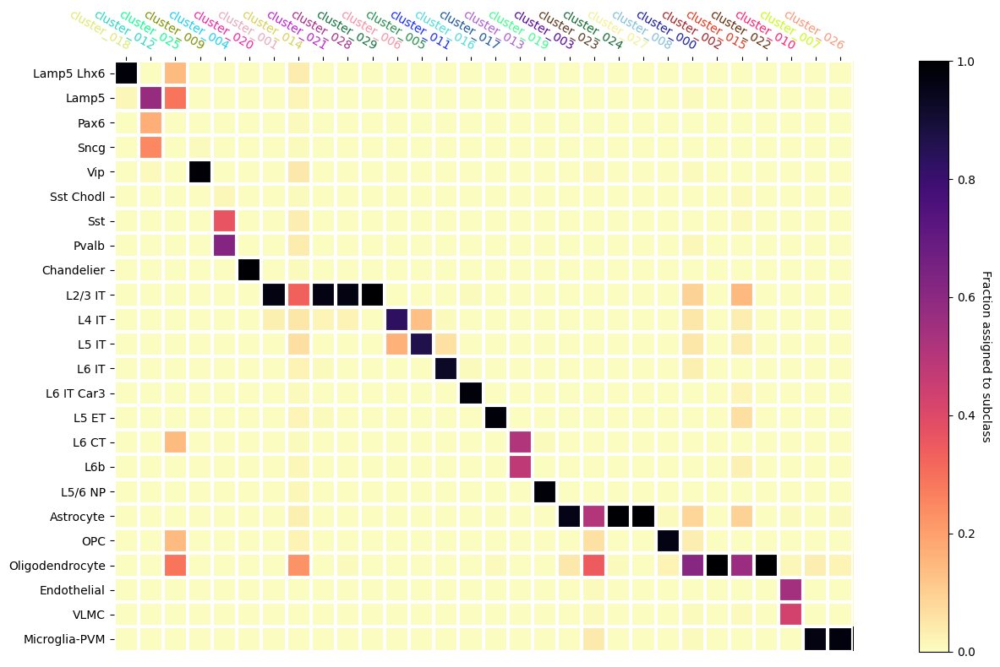

In [23]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 8)

heatmap(
    data=assignment_df,
    row_labels=assignment_df.index.to_numpy(),
    col_labels=assignment_df.columns,
    cmap=plt.cm.magma_r,
    vmin=0,
    vmax=1,
    cbarlabel="Fraction assigned to subclass",
    xtick_colors=value_sets.loc[assignment_df.columns]['color_hex_triplet'].to_numpy()
)

fig.tight_layout()

In a related notebook, we explore a similar MapMyCells mapping with the [Siletti taxonomy](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_siletti_taxonomy.html). You can also explore gene expressions in the [following notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_gene_expression.html).